In [1]:
%matplotlib inline

import warnings; warnings.simplefilter('ignore')

In [8]:
import pandas as pd
import os
from functools import reduce
import matplotlib.pyplot as plt
import numpy as np

from scipy.stats.stats import pearsonr
from scipy import stats
from scipy.stats import ks_2samp
from scipy.stats import entropy
from scipy.stats import norm
from scipy.stats import lognorm
from scipy.stats import nbinom
from scipy.stats.mstats import gmean
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import average
from scipy.cluster.hierarchy import dendrogram


import statsmodels.api as sm
lowess = sm.nonparametric.lowess
import math

import scipy.spatial.distance 
from scipy.spatial.distance import *
from scipy.spatial.distance import cosine
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform

import sklearn
import sklearn.preprocessing

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE

from matplotlib.colors import LinearSegmentedColormap

import seaborn as sns

In [3]:
filepath = "eisen_1998.txt"

#
# data from Eisen 1998
# 

e98 = pd.read_csv(filepath, sep="\t")

e98_datacols = e98.columns.values[2:]

e98_data = e98[e98_datacols].fillna(0).values
e98_genes = e98['ORF']

# set everything to have unit norm for some applications

e98_datan = sklearn.preprocessing.normalize(e98_data)

In [4]:
def parse_tree(children,node):
    if len(children[node]) == 1:
        return [node]
    else:
        return parse_tree(children,children[node][0]) + parse_tree(children,children[node][1]) 

In [5]:
X = e98_data

ac = AgglomerativeClustering(n_clusters = 10, affinity='cosine', linkage='average')
ac.fit(X)
cl = ac.fit_predict(X)

In [6]:
leaves = ac.n_leaves_
children = []
for i in range(0,leaves):
    children.append([i])
for i in ac.children_:
    children.append([i[0],i[1]])
    
order = parse_tree(children,len(children)-1)

inorder = np.zeros(len(order),dtype=int)
for i,o in enumerate(order):
    inorder[o] = i   
e98['order'] = inorder
    

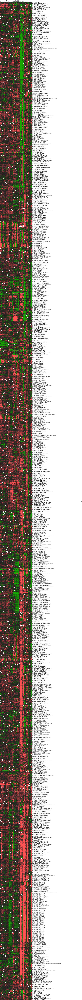

In [7]:
e98_plot = e98.set_index('NAME').sort_values('order')[e98_datacols]

cpi = 6
xs = len(e98_datacols)/cpi
ys = len(e98_plot)/cpi

fig, ax = plt.subplots(1,1,figsize=(xs,ys))
cmap = sns.diverging_palette(12.2, 127, s=99.9, l=60.0,n=10, center="dark", as_cmap=True)

sns.set(font_scale=0.8)

hm = sns.heatmap(e98_plot, cmap=cmap, vmin = -1.0, vmax = 1.0, center=0,xticklabels = True, 
                 yticklabels = True, cbar = False)

# x axis on top

ax.xaxis.tick_top() 
ax.xaxis.set_label_position('top')
xticklabels = ax.get_xticklabels()
h = ax.set_xticklabels(xticklabels, rotation = 90)

# y axis on right

ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
yticklabels = ax.get_yticklabels()
h = ax.set_yticklabels(yticklabels, rotation = 0)



In [ ]:
X = e98_data

cl = KMeans(n_clusters = 20, init = 'k-means++')
cl.fit(X)
e98['km'] = cl.fit_predict(X)

In [ ]:
e98_plot = e98.set_index('NAME').sort_values('km')[e98_datacols]

cpi = 6
xs = len(e98_datacols)/cpi
ys = len(e98_plot)/cpi

fig, ax = plt.subplots(1,1,figsize=(xs,ys))
cmap = sns.diverging_palette(12.2, 127, s=99.9, l=60.0,n=10, center="dark", as_cmap=True)

sns.set(font_scale=0.8)

hm = sns.heatmap(e98_plot, cmap=cmap, vmin = -1.0, vmax = 1.0, center=0,xticklabels = True, 
                 yticklabels = True, cbar = False)

# x axis on top

ax.xaxis.tick_top() 
ax.xaxis.set_label_position('top')
xticklabels = ax.get_xticklabels()
h = ax.set_xticklabels(xticklabels, rotation = 90)

# y axis on right

ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
yticklabels = ax.get_yticklabels()
h = ax.set_yticklabels(yticklabels, rotation = 0)

In [ ]:
e98_plot = e98[e98['km'] == 10].set_index('NAME')[e98_datacols]

cpi = 6
xs = len(e98_datacols)/cpi
ys = len(e98_plot)/cpi

fig, ax = plt.subplots(1,1,figsize=(xs,ys))
cmap = sns.diverging_palette(12.2, 127, s=99.9, l=60.0,n=10, center="dark", as_cmap=True)

sns.set(font_scale=0.8)

hm = sns.heatmap(e98_plot, cmap=cmap, vmin = -1.0, vmax = 1.0, center=0,xticklabels = True, 
                 yticklabels = True, cbar = False)

# x axis on top

ax.xaxis.tick_top() 
ax.xaxis.set_label_position('top')
xticklabels = ax.get_xticklabels()
h = ax.set_xticklabels(xticklabels, rotation = 90)

# y axis on right

ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
yticklabels = ax.get_yticklabels()
h = ax.set_yticklabels(yticklabels, rotation = 0)

In [ ]:
X = e98_data

cl = DBSCAN(metric = 'cosine')
cl.fit(X)
e98['dbscan'] = cl.fit_predict(X)

In [ ]:
e98_plot = e98[e98['dbscan'] == 0].set_index('NAME').head(20)[e98_datacols]

cpi = 6
xs = len(e98_datacols)/cpi
ys = len(e98_plot)/cpi

fig, ax = plt.subplots(1,1,figsize=(xs,ys))
cmap = sns.diverging_palette(12.2, 127, s=99.9, l=60.0,n=10, center="dark", as_cmap=True)

sns.set(font_scale=0.8)

hm = sns.heatmap(e98_plot, cmap=cmap, vmin = -1.0, vmax = 1.0, center=0,xticklabels = True, 
                 yticklabels = True, cbar = False)

# x axis on top

ax.xaxis.tick_top() 
ax.xaxis.set_label_position('top')
xticklabels = ax.get_xticklabels()
h = ax.set_xticklabels(xticklabels, rotation = 90)

# y axis on right

ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
yticklabels = ax.get_yticklabels()
h = ax.set_yticklabels(yticklabels, rotation = 0)

In [ ]:
X = e98_data
X_embedded = TSNE(n_components=2).fit_transform(X)

In [ ]:
plt.scatter(X_embedded[:,0],X_embedded[:,1],s=1)

In [ ]:
X_embedded

In [ ]:
dge = pd.read_csv("dge_normalized.txt",sep = "\t" )

In [ ]:
hgdp = pd.read_csv("hgdp/HGDP_FinalReport_Forward.txt", sep = "\t")